In [1]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [2]:
filename = 'P:/CoxaAI/preprocess_data/csv_detection_info/CC.csv'
filename_clean = 'P:/CoxaAI/preprocess_data/csv_detection_info_clean/CC.csv'
saved_cropped_image = 'P:/CoxaAI/preprocess_data/cropped/CC'

In [3]:
detection_df = pd.read_csv(filename)

In [4]:
detection_df

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw
0,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.9.0.2367908902.67149528.10...,1-22065634,1.2.392.200036.9125.9.0.2367908902.67149528.10...,1153,1311,446,564,0.965887,False,2,CC
1,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.9.0.2367908902.67149528.10...,1-22065634,1.2.392.200036.9125.9.0.2367908902.67149528.10...,1137,1293,1014,1128,0.944962,False,2,CC
2,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.9.0.2367919397.33595096.10...,1-22065634,1.2.392.200036.9125.9.0.2367919397.33595096.10...,1083,1239,971,1087,0.982592,False,2,CC
3,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.9.0.2367919397.33595096.10...,1-22065634,1.2.392.200036.9125.9.0.2367919397.33595096.10...,1090,1246,400,516,0.974501,False,2,CC
4,P:/CoxaAI/Sortering 1/CC,1.3.51.0.7.11897662126.65461.14923.47796.24285...,1-22092919,1.3.51.0.7.11897662126.65461.14923.47796.24285...,1440,1737,950,1161,0.992270,False,2,CC
...,...,...,...,...,...,...,...,...,...,...,...,...
208,P:/CoxaAI/Sortering 1/CC,1.2.276.0.95.29487.1.20230116.160358.0.2.15432...,1-23005266,1.2.276.0.95.29487.1.20230116.160358.0.2.15432...,710,833,804,896,0.975043,False,2,CC
209,P:/CoxaAI/Sortering 1/CC,1.2.276.0.95.29487.1.20230116.160445.0.2.15432...,1-23005266,1.2.276.0.95.29487.1.20230116.160445.0.2.15432...,855,974,330,419,0.984297,False,2,CC
210,P:/CoxaAI/Sortering 1/CC,1.2.276.0.95.29487.1.20230116.160445.0.2.15432...,1-23005266,1.2.276.0.95.29487.1.20230116.160445.0.2.15432...,851,972,817,909,0.966850,False,2,CC
211,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.4.0.2720249472.151037024.2...,1-23006108,1.2.392.200036.9125.4.0.2720249472.151037024.2...,851,985,681,777,0.993785,False,2,CC


### [Optional] Sort by confidence (filter out bad prediction)

In [5]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [6]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([94, 131, 204], dtype='int64')

Note that there are some cases that are not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [7]:
# plot every 9 of them

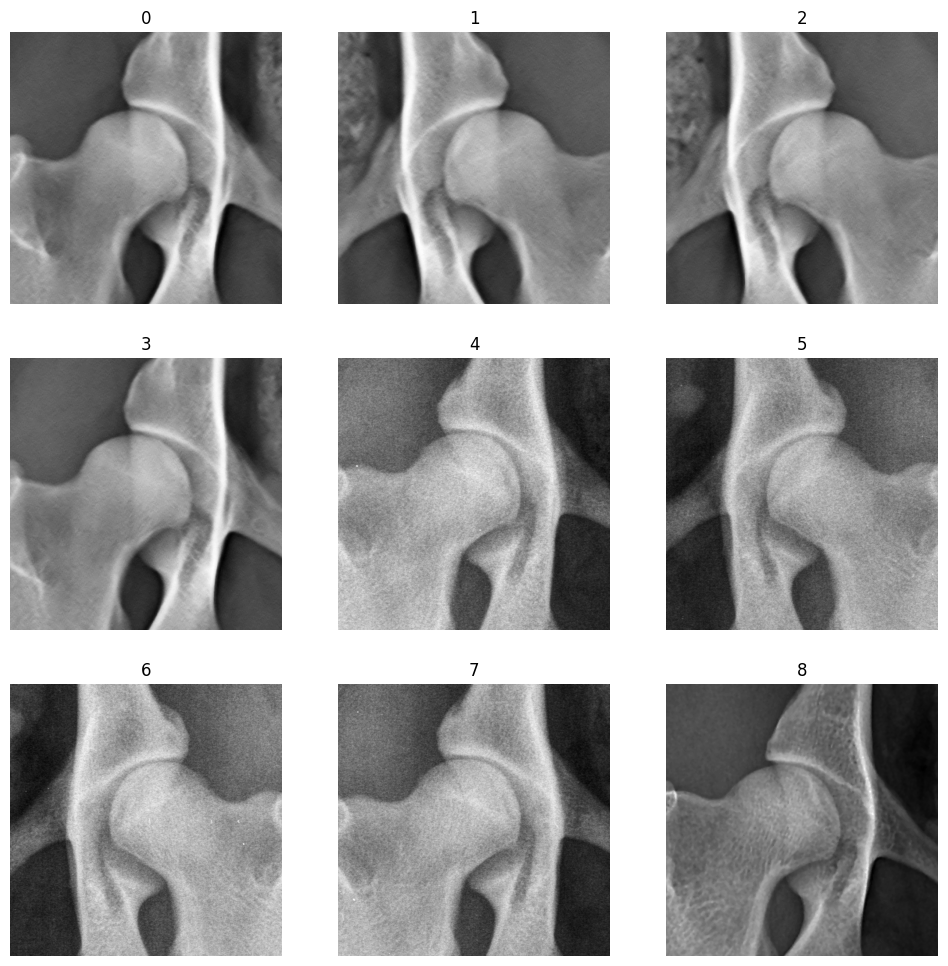

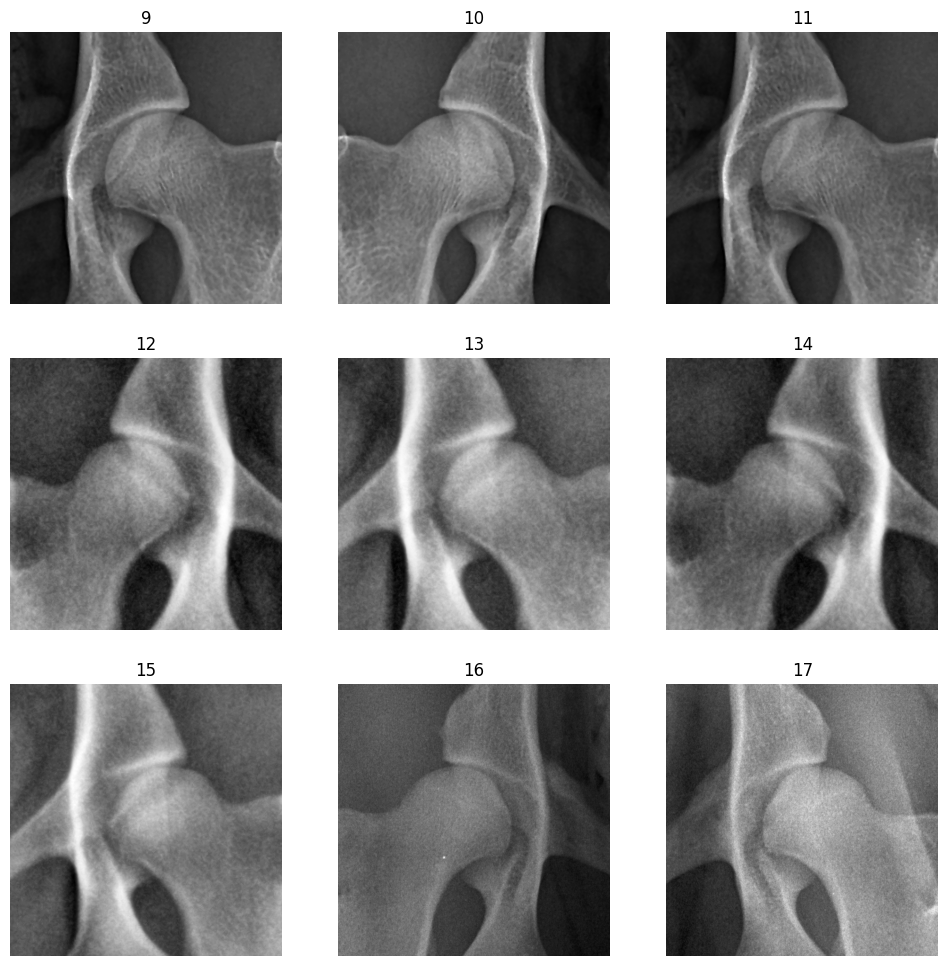

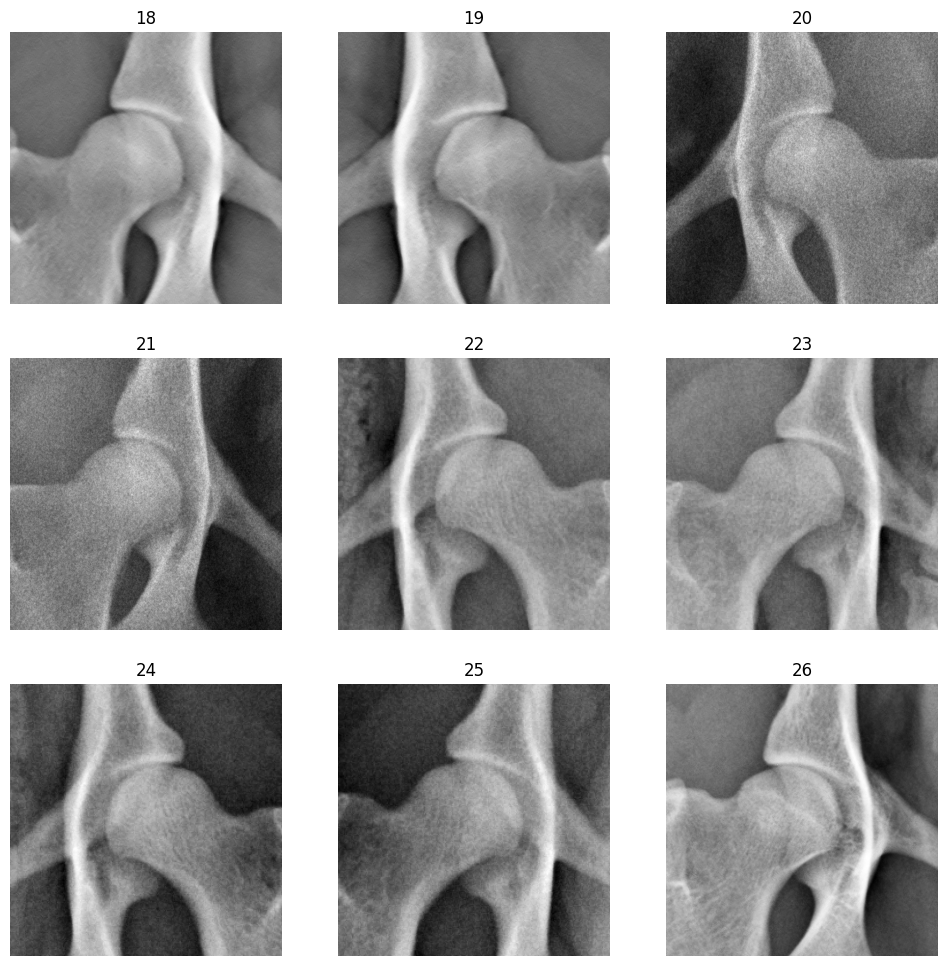

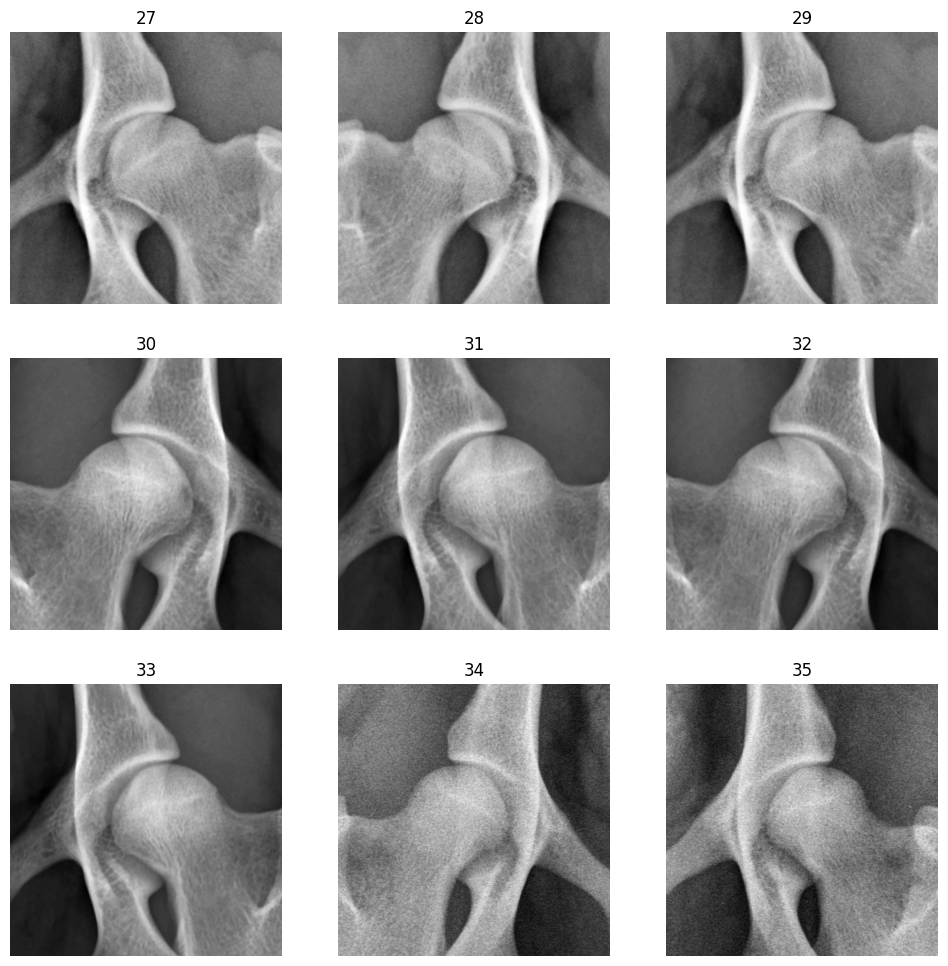

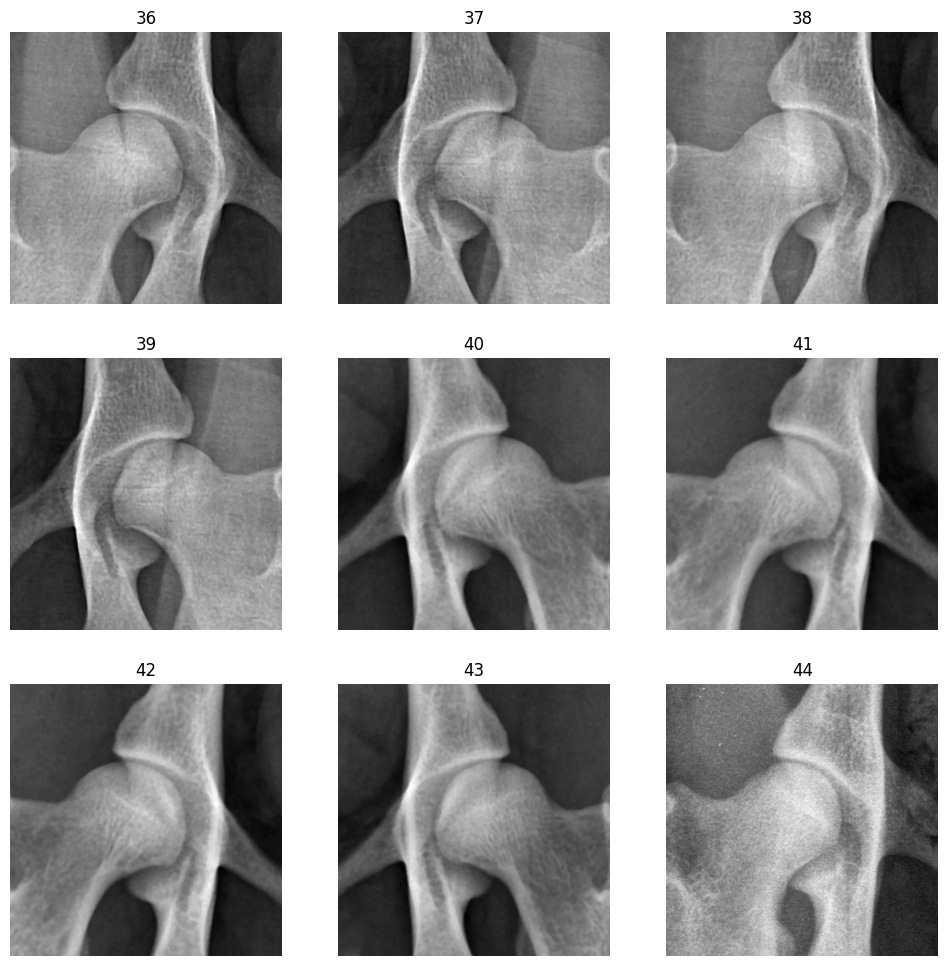

...

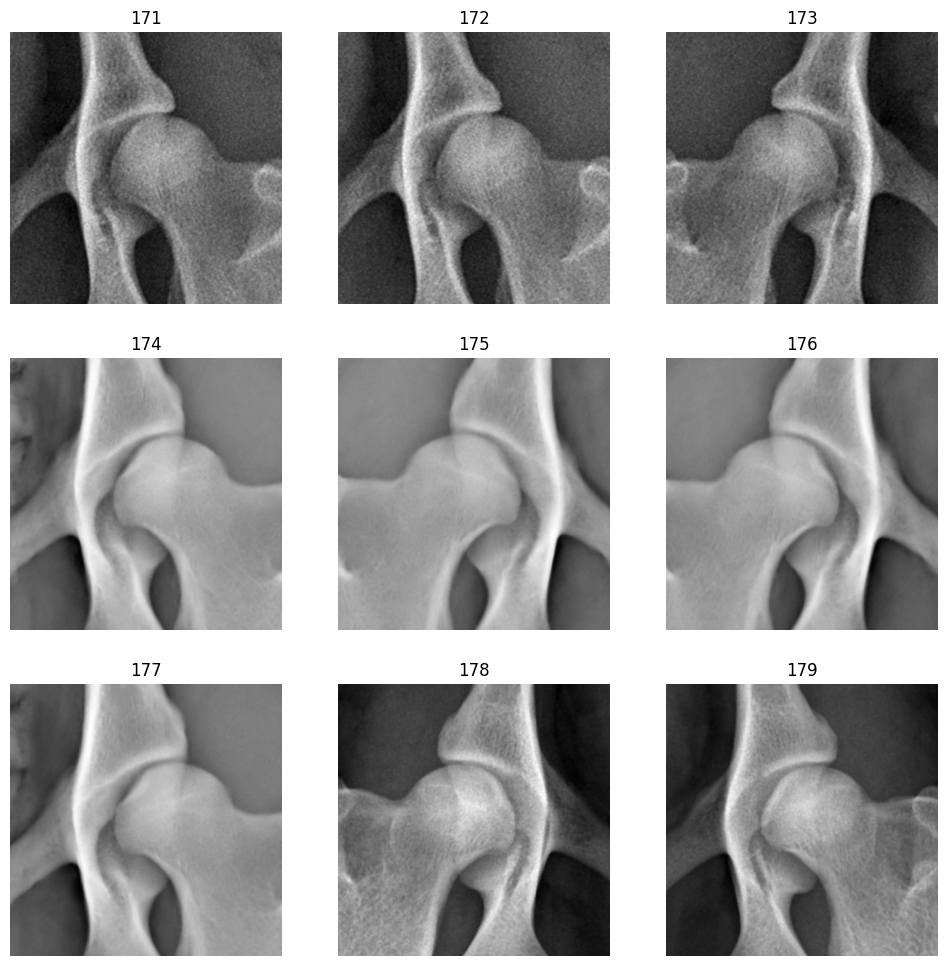

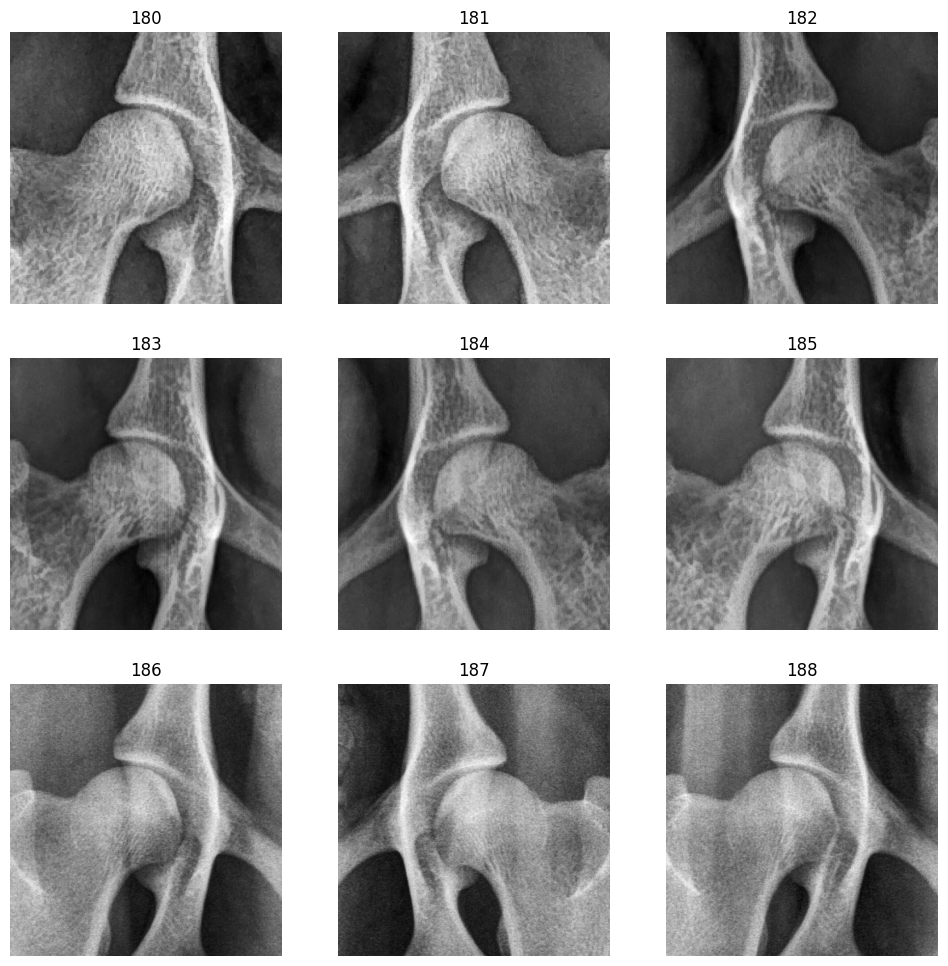

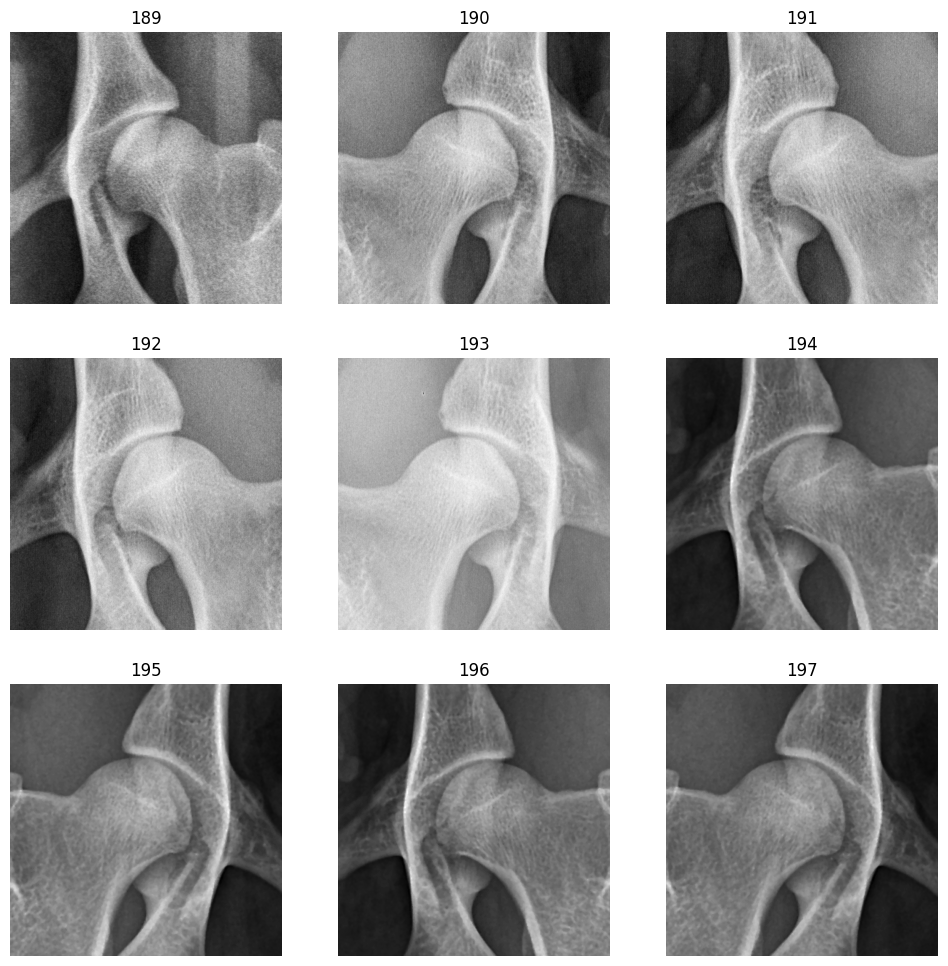

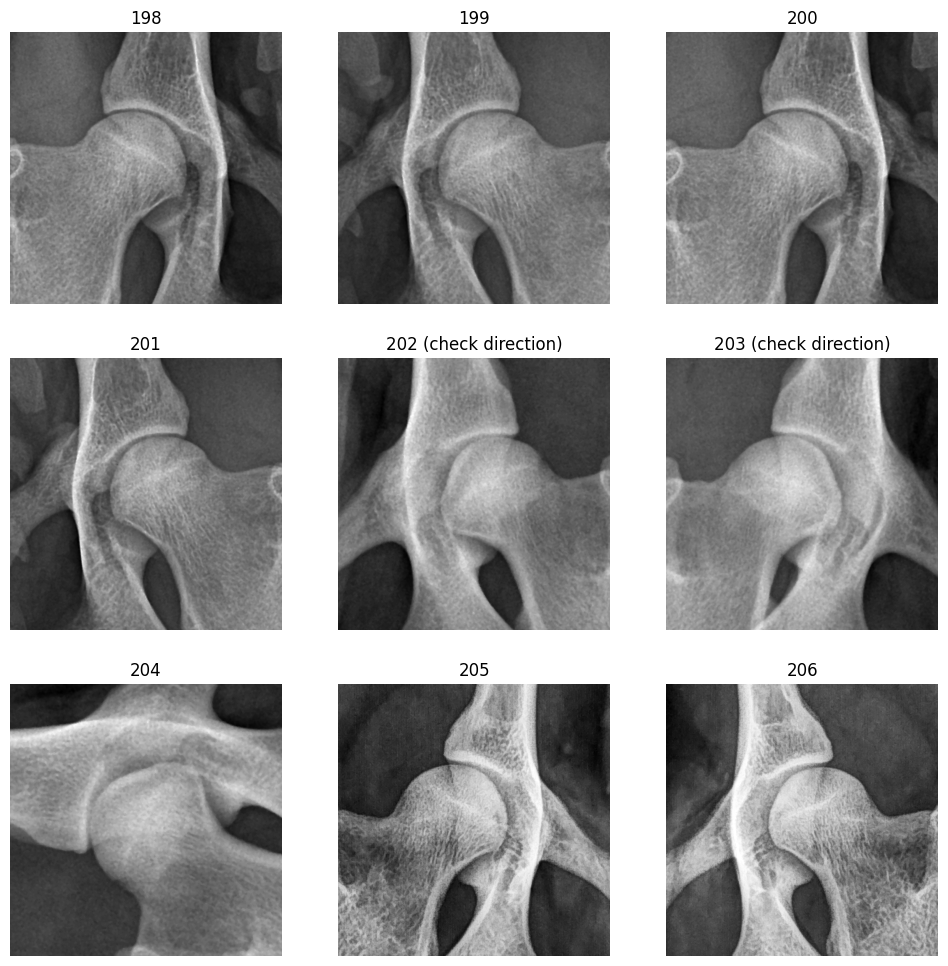

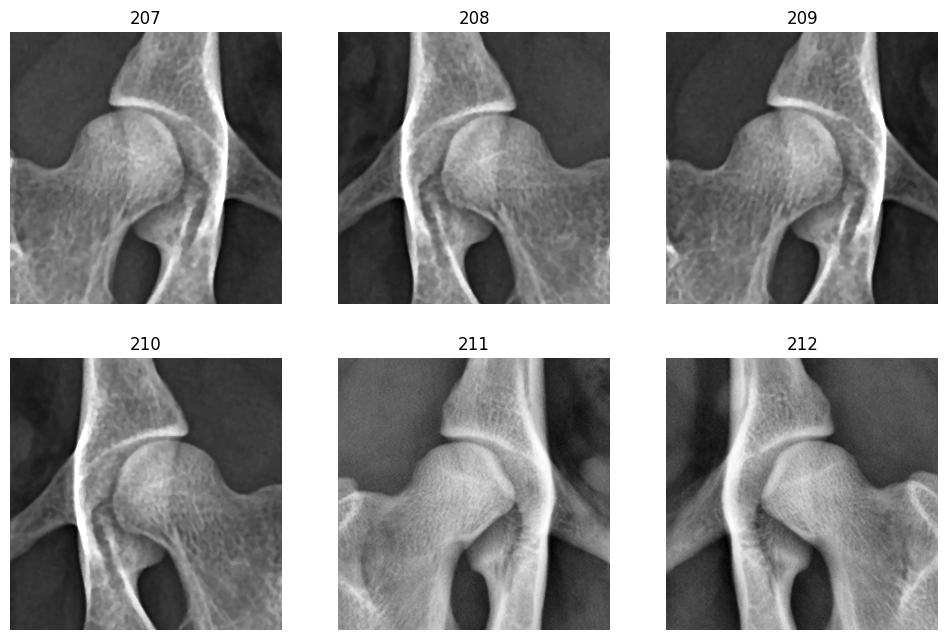

In [8]:
for id, item in detection_df.iterrows():
    fn = item['crop_name']
    img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    suffix = ' (check direction)' if item['is_rotated'] else ''
#     parent = item['parent_name']
#     if not pd.isnull(parent):
#         img = np.load(os.path.join(saved_cropped_image, parent,fn + '.npy'))
#     else:
#         img = np.load(os.path.join(saved_cropped_image,fn + '.npy'))
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id)+suffix)

    if (id%9) == 8:
        plt.show()                    
        
plt.show()

## Assign "flipped" column before removing failed predictions

In [9]:
flipped = np.array([False] * detection_df.shape[0])
flipped_indice = [148, 149, 150, 151]
flipped[detection_df.index.isin(flipped_indice)] = True
detection_df['flipped'] = flipped

## Remove bad detection items

In [10]:
remove_indice = [204] # just to make all hips are in the right direction
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
0,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.9.0.2367908902.67149528.10...,1-22065634,1.2.392.200036.9125.9.0.2367908902.67149528.10...,1153,1311,446,564,0.965887,False,2,CC,False
1,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.9.0.2367908902.67149528.10...,1-22065634,1.2.392.200036.9125.9.0.2367908902.67149528.10...,1137,1293,1014,1128,0.944962,False,2,CC,False
2,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.9.0.2367919397.33595096.10...,1-22065634,1.2.392.200036.9125.9.0.2367919397.33595096.10...,1083,1239,971,1087,0.982592,False,2,CC,False
3,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.9.0.2367919397.33595096.10...,1-22065634,1.2.392.200036.9125.9.0.2367919397.33595096.10...,1090,1246,400,516,0.974501,False,2,CC,False
4,P:/CoxaAI/Sortering 1/CC,1.3.51.0.7.11897662126.65461.14923.47796.24285...,1-22092919,1.3.51.0.7.11897662126.65461.14923.47796.24285...,1440,1737,950,1161,0.992270,False,2,CC,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
208,P:/CoxaAI/Sortering 1/CC,1.2.276.0.95.29487.1.20230116.160358.0.2.15432...,1-23005266,1.2.276.0.95.29487.1.20230116.160358.0.2.15432...,710,833,804,896,0.975043,False,2,CC,False
209,P:/CoxaAI/Sortering 1/CC,1.2.276.0.95.29487.1.20230116.160445.0.2.15432...,1-23005266,1.2.276.0.95.29487.1.20230116.160445.0.2.15432...,855,974,330,419,0.984297,False,2,CC,False
210,P:/CoxaAI/Sortering 1/CC,1.2.276.0.95.29487.1.20230116.160445.0.2.15432...,1-23005266,1.2.276.0.95.29487.1.20230116.160445.0.2.15432...,851,972,817,909,0.966850,False,2,CC,False
211,P:/CoxaAI/Sortering 1/CC,1.2.392.200036.9125.4.0.2720249472.151037024.2...,1-23006108,1.2.392.200036.9125.4.0.2720249472.151037024.2...,851,985,681,777,0.993785,False,2,CC,False


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
exclude_ids = pd.read_csv('exclude_id.csv').id.values
new_detection_df = new_detection_df[~new_detection_df.parent_name.isin(exclude_ids)]
print(new_detection_df.shape)

(212, 13)


In [13]:
new_detection_df.to_csv(filename_clean, index=False)

In [14]:
detection_df[detection_df.index.isin(remove_indice)]

,base_path,filename,parent_name,crop_name,ax0_min,ax0_max,ax1_min,ax1_max,confidence,is_rotated,diagnosis,diagnosis_raw,flipped
204,P:/CoxaAI/Sortering 1/CC,1.2.276.0.95.15181.1.20230116.100808.0.2.464.dcm,1-23005019,1.2.276.0.95.15181.1.20230116.100808.0.2.464.d...,1439,1605,1200,1325,0.315726,False,2,CC,False
